### Objectives of this notebook:
- display output from ABRM
- perform analysis on output. eg. feature importance and model selection
- in console do: jupyter nbconvert --to="python" '.\Postprocessing.ipynb'
- this will upload the file in pure python format

In [1]:
import numpy as np
import pandas as pd
import plotly.io as pio
from postprocessing import postprocessing
pio.renderers.default = "notebook"
# pio.renderers.default = "browser"
# from collections import Counter

### Import data
- one df with FD performance of each particle  
- one df with associated particle position  
- one dicct with initial setup that would allow reproduction of results

In [2]:
# dataset = ["2020_08_25_11_25"]
# dataset = ["2020_08_26_19_14"]
# dataset = ["2020_09_11_11_20"]
# dataset = ["2020_09_12_11_04"]
dataset = ["2020_09_14_09_47"]


#


data = postprocessing(dataset)
data.read_data()

Number of models and parameters:


(3, 36)

Number of particles:


3

Number of Iterations:


1

,EV,tD,F,Phi,LC,tof,iteration,particle_no,misfit,dataset
0,0.000000,0.000000,0.000000,0.000000,0.24349,175267660.0,0,0,0.467654,2020_09_14_09_47
1,0.286064,0.286079,0.001356,0.000373,0.24349,455449300.0,0,0,0.467654,2020_09_14_09_47
2,0.296219,0.296254,0.002715,0.000770,0.24349,184783620.0,0,0,0.467654,2020_09_14_09_47
3,0.306179,0.306246,0.003825,0.001104,0.24349,341864420.0,0,0,0.467654,2020_09_14_09_47
4,0.314487,0.314593,0.005427,0.001601,0.24349,267701200.0,0,0,0.467654,2020_09_14_09_47


,TI1,F1_I_MIN,F1_I_MAX,F1_J_MIN,F1_J_MAX,F1_K_MIN,F1_K_MAX,TI2,F2_I_MIN,F2_I_MAX,...,FracpermY,MatrixpermY,FracpermZ,MatrixpermZ,misfit,LC,iteration,particle_no,tof_based_entropy_best_models,dataset
0,3.0,122.0,76.0,33.0,36.0,4.0,2.0,4.0,95.0,168.0,...,792.52826,7.315754,873.876300,56.652420,0.467654,0.243490,0,0,8.889317,2020_09_14_09_47
1,2.0,139.0,107.0,28.0,19.0,5.0,6.0,1.0,90.0,195.0,...,1255.79590,70.567795,126.341156,26.525223,0.412005,0.289748,0,1,8.889317,2020_09_14_09_47
2,4.0,189.0,140.0,98.0,61.0,5.0,3.0,3.0,1.0,160.0,...,102.05313,19.356020,838.348000,48.750416,0.262057,0.381810,0,2,8.889317,2020_09_14_09_47


,tof,misfit,iteration,particle_no,dataset
0,175267664.0,0.467654,0,0,2020_09_14_09_47
1,163457296.0,0.467654,0,0,2020_09_14_09_47
2,167074864.0,0.467654,0,0,2020_09_14_09_47
3,167880976.0,0.467654,0,0,2020_09_14_09_47
4,170751376.0,0.467654,0,0,2020_09_14_09_47


In [3]:
data.get_df_best(misfit_tolerance = 1 ,window_shape = (1,1,1),step_size = 1)


### Plot performance

In [12]:
data.setup["base_path"] / "../Output/"/ data.data_to_process[0] / "all_models/INCLUDE/GRID.GRDECL"


WindowsPath('C:/AgentBased_RM/ABRM_functions/../Output/2020_09_14_09_47/all_models/INCLUDE/GRID.GRDECL')

In [11]:
data.setup["base_path"] / "../Output/" / data.data_to_process[0] / "/"

WindowsPath('C:/AgentBased_RM/ABRM_functions/../Output/2020_09_14_09_47')

In [5]:
pio.renderers.default = "browser"
data.plot_performance()

### Histogram Paramters

In [5]:
pio.renderers.default = "notebook"
data.plot_hist(misfit_tolerance= True)

### Histograms for best models parameters

In [7]:
data.plot_hist()

### Boxplots parameters
explore if ranges of parameters need potential modifications

In [7]:
data.plot_box()

### Grid distribution of entropy based on time of flight of best models

205755.77149138376


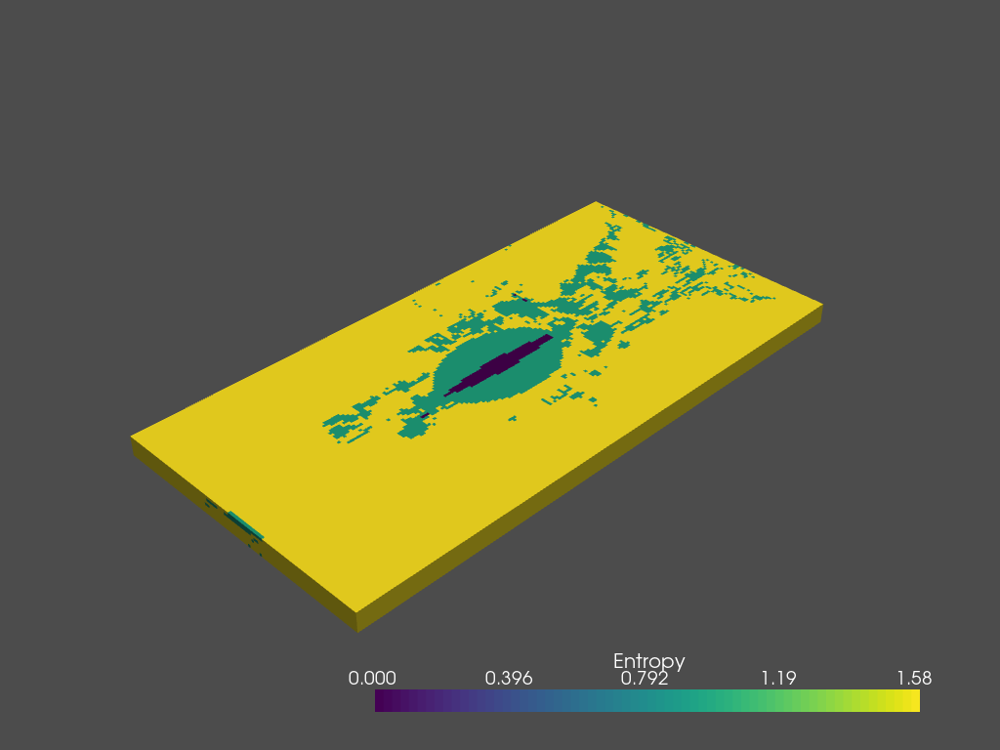

In [4]:
data.plot_tof_entropy()

### Plot model

In [ ]:
data.plot_best_model(random_model = True,model_id = 0,property = "PORO")



[Geometry] Converting GRDECL to Paraview Hexahedron mesh data....
     NumOfPoints 1120000
     NumOfCells 140000
     .....Done!
[Output] Writing "Results\GRID.vtu" Paraview file....

In [7]:
data.df_best_tof.shape

(3, 140002)

In [16]:
from pyentrp import entropy as ent

In [20]:
cell = np.round(np.array(data.df_best_tof[2]).reshape(-1)/60/60/24/365.25)
cell_binned = np.digitize(cell,bins=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20])
cell_entropy = np.array(ent.shannon_entropy(cell_binned))
cell_entropy

array(1.5849625)

In [7]:
%%time

nx = 200
ny = 100
nz = 7
all_cells_entropy = []
all_cell_cluster_id = []
for i in range(data.df_best_tof.shape[1]-2):
    # single cell in all models, from seconds to years    
    cell = np.array(data.df_best_tof[i]).reshape(-1,1)/60/60/24/365.25

    # discretize with the help of HDBSCAN
    # Create HDBSCAN clusters
    hdb = hdbscan.HDBSCAN(min_cluster_size=2,
                        min_samples=1, 
                        cluster_selection_epsilon=0.1,
#                         cluster_selection_method = "leaf"#, cluster_selection_epsilon = 0.1)#,min_samples  =1)
                        )
    scoreTitles = hdb.fit(cell)
    cell_cluster_id = scoreTitles.labels_
    all_cell_cluster_id.append(cell_cluster_id)

    # calculate entropy based upon clusters
    cell_entropy = np.array(ent.shannon_entropy(cell_cluster_id))
    all_cells_entropy.append(cell_entropy)

NameError: name 'hdbscan' is not defined

In [8]:
import pyvista as pv
import matplotlib as plt

205755.77149138376


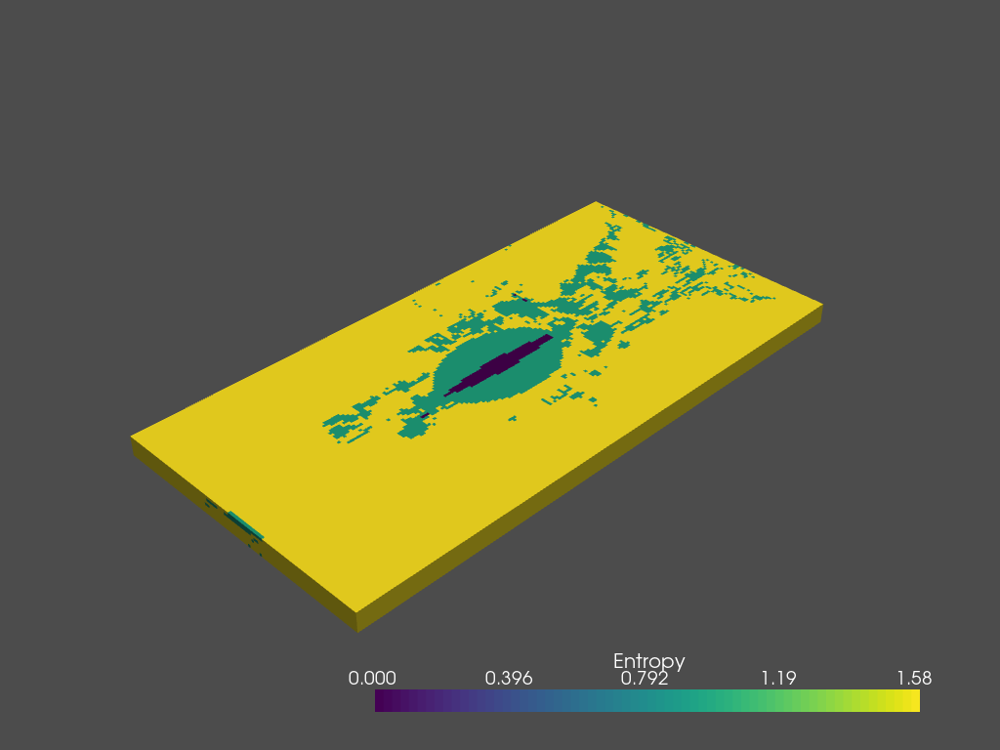

Wall time: 7.94 s


In [12]:
%%time

nx = 200
ny = 100
nz = 7
# all_cells_entropy = [None]*(data.df_best_tof.shape[1]-2)
all_cells_entropy = []
all_cell_cluster_id = []
for i in range(data.df_best_tof.shape[1]-2):
    # single cell in all models, from seconds to years    
    cell = np.round(np.array(data.df_best_tof[i]).reshape(-1)/60/60/24/365.25)

    # discretize with the help of HDBSCAN
    # Create HDBSCAN clusters
    cell_binned = np.digitize(cell,bins=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20])

#     all_cell_cluster_id.append(cell_cluster_id)

#     # calculate entropy based upon clusters
    cell_entropy = np.array(ent.shannon_entropy(cell_binned))
    all_cells_entropy.append(cell_entropy)
#     all_cells_entropy[i] = cell_entropy
    
print(np.sum(all_cells_entropy))
        # plot the whole thing
        
values = np.array(all_cells_entropy).reshape(nx,ny,nz)

# Create the spatial reference
grid = pv.UniformGrid()

# Set the grid dimensions: shape + 1 because we want to inject our values on the CELL data
grid.dimensions = np.array(values.shape) + 1

# Edit the spatial reference
grid.origin = (1, 1, 1)  # The bottom left corner of the data set
grid.spacing = (1, 1, 1)  # These are the cell sizes along each axis

# Add the data values to the cell data
grid.cell_arrays["Entropy"] =values.flatten()# np.log10(tof)# np.log10(tof)# values.flatten(order="C")  # Flatten the array! C F A K

boring_cmap = plt.cm.get_cmap("viridis")
grid.plot(show_edges=False,cmap = boring_cmap)


In [30]:
hist(np.array(all_cells_entropy))

In [128]:
data.df_best_tof.head()

,0,1,2,3,4,5,6,7,8,9,...,139992,139993,139994,139995,139996,139997,139998,139999,iteration,particle_no
136,1.118253e+08,1.061817e+08,1.036488e+08,1.025707e+08,1.002067e+08,9.868408e+07,9.845774e+07,9.853558e+07,1.003690e+08,1.030285e+08,...,1.496199e+08,1.492213e+08,1.484446e+08,1.448825e+08,1.432141e+08,1.415753e+08,1.434034e+08,1.460475e+08,4,16
140,6.396531e+08,5.727017e+08,5.514892e+08,5.312771e+08,5.251156e+08,5.222549e+08,5.208558e+08,5.207773e+08,5.255185e+08,5.208052e+08,...,1.924714e+09,1.704022e+09,1.653211e+09,1.653312e+09,1.638741e+09,1.579645e+09,1.562712e+09,1.543578e+09,4,20
168,4.552206e+08,3.948163e+08,3.898880e+08,3.877082e+08,3.861303e+08,3.849468e+08,3.840275e+08,3.837768e+08,3.817412e+08,3.787388e+08,...,1.327832e+09,1.328954e+09,1.329894e+09,1.322463e+09,1.320444e+09,1.320893e+09,1.320657e+09,1.319043e+09,5,18
175,2.392514e+09,2.706227e+09,3.068651e+09,3.259112e+09,3.421432e+09,3.487138e+09,3.521750e+09,3.811844e+09,4.197546e+09,4.233078e+09,...,4.476707e+09,4.344737e+09,4.200314e+09,4.052269e+09,3.917340e+09,3.790086e+09,3.696247e+09,3.622409e+09,5,25
182,6.727277e+08,6.558253e+08,6.494902e+08,6.432478e+08,6.327616e+08,6.102428e+08,6.072489e+08,6.048938e+08,6.060052e+08,5.948543e+08,...,2.006229e+09,1.829042e+09,1.796285e+09,1.795174e+09,1.797086e+09,1.797278e+09,1.790435e+09,1.779935e+09,6,2


In [103]:
values = np.array(data.df_best_tof).reshape(nx,ny,nz)

# Create the spatial reference
grid = pv.UniformGrid()

# Set the grid dimensions: shape + 1 because we want to inject our values on the CELL data
grid.dimensions = np.array(values.shape) + 1

# Edit the spatial reference
grid.origin = (1, 1, 1)  # The bottom left corner of the data set
grid.spacing = (1, 1, 1)  # These are the cell sizes along each axis

# Add the data values to the cell data
grid.cell_arrays["Entropy"] =values.flatten()# np.log10(tof)# np.log10(tof)# values.flatten(order="C")  # Flatten the array! C F A K

boring_cmap = plt.cm.get_cmap("viridis")
grid.plot(show_edges=False,cmap = boring_cmap)
    

ValueError: cannot reshape array of size 17500250 into shape (200,100,7)

In [91]:
data.df_best

351587.84569560137

In [75]:
x = np.random.randint(low=25, high=200, size=10)
np.digitize(cell,bins=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15])

array([15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15,
       15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15,
       15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15,
       15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15,
       15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15,
       15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15,
       15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15,
       15, 15, 15, 15, 15, 15], dtype=int64)

In [10]:
import hdbscan
import time
from pyentrp import entropy as ent


### Cluster best models with UMAP and HDBSCAN

In [8]:
data.clustering_tof_or_PSO(cluster_parameter="PSO_parameters")

In [11]:
data.clustering_sweep_efficiency_or_F_Phi(cluster_parameter="F_Phi")

### Selection of models to save

In [18]:
data.cluster_model_selection(include_unclustered= False,cluster_parameter = "F_Phi",n_reservoir_models=20)


### Save selected models, ready for flow simulation

In [20]:
data.save_best_clustered_models()

# Diversity Tests

In [5]:
import pyvista as pv
from pyentrp import entropy as ent
from skimage.util.shape import view_as_windows
from sklearn import preprocessing 
import hdbscan
import umap
import matplotlib. pyplot as plt
from GRDECL_file_reader.GRDECL2VTK import *


In [9]:
Model = GeologyModel(filename = "C:/AgentBased_RM/FD_Models/INCLUDE/GRID.GRDECL")
TempData=Model.LoadCellData(varname="PORO",filename='C:/AgentBased_RM/Output/2020_08_25_11_25/best_models/INCLUDE/PORO/M0.GRDECL')

In [12]:
Model.GRDECL2VTK()
# Model.Write2VTU()
# Model.decomposeModel()
# Model.Write2VTU()
Model.Write2VTP()
# # mesh = pv.read('Results\pygrdecl_2.vtp')

[Geometry] Converting GRDECL to Paraview Hexahedron mesh data....
     NumOfPoints 1120000
     NumOfCells 140000
     .....Done!
[Output] Writing "Results\GRID.vtu" Paraview file....Done!
[Output] Writing "Results\GRID.vtp" VTP file..vtp file created.


In [14]:
mesh = pv.read('Results\GRID.vtp')
mesh.plot(scalars = "PORO",show_edges=False, notebook=False)

C:\Users\bs48\AppData\Local\Continuum\anaconda_3\envs\ABRM\lib\site-packages\pyvista\plotting\plotting.py:3909: UserWarning:

`auto_close` ignored: by clicking the exit button, you have destroyed the render window and we have to close it out.



[(-1278.563684620958, -704.7639662303898, -3092.0344668955963),
 (1002.2629582262598, 492.69403076171875, 462.95501708984375),
 (0.37495007447811635, 0.7787907497405445, -0.5028890630819243)]

### Feature importance - model explainability

In [8]:
import shap
from sklearn.ensemble import RandomForestRegressor


In [9]:
columns = setup_all[dataset[0]]["columns"]
X_train = df_position[columns]
Y_train = df_position.LC

In [10]:
# load JS visualization code to notebook
shap.initjs()

In [11]:
model = RandomForestRegressor(max_depth=6, random_state=0, n_estimators=10)
model.fit(X_train, Y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=6, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=10, n_jobs=None, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


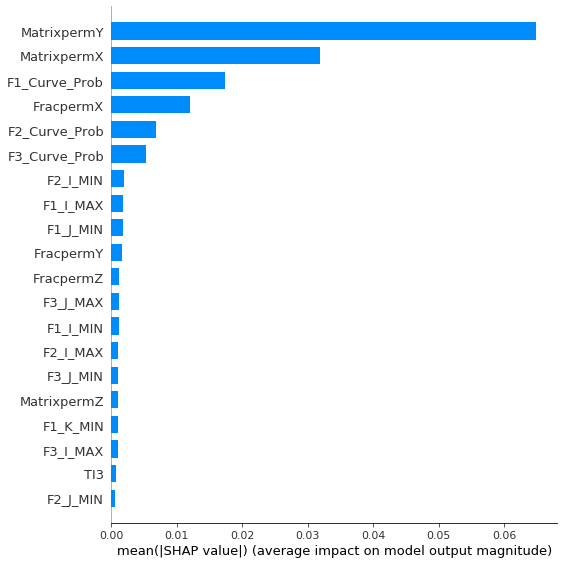

In [12]:
shap_values = shap.TreeExplainer(model).shap_values(X_train)
shap.summary_plot(shap_values, X_train, plot_type="bar")

In [20]:
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn and spark models)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[80,:], X_train.iloc[80,:])

In [21]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, X_train)

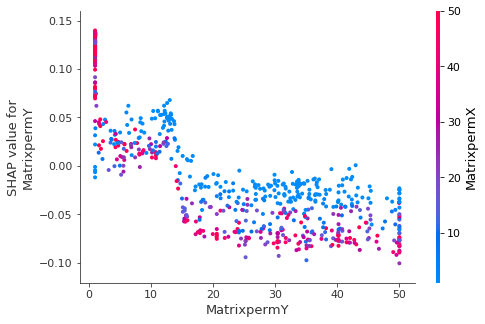

In [13]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("MatrixpermY", shap_values, X_train)

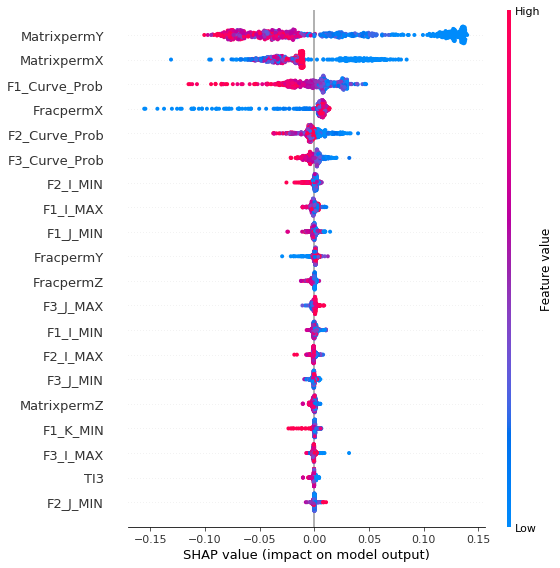

In [14]:
shap.summary_plot(shap_values, X_train)


In [15]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
def plot_performance(df_performance,df_position,FD_targets,setup_all,dataset,misfit_tolerance):
    # Create traces

    fig = make_subplots(rows = 2, cols = 1,
                       subplot_titles = ("F - Phi Graph","Sweep Efficieny Graph"))

    ### Misfit ###
    
 

#     ### LC plot ###
    
#     fig.add_trace(go.Scatter(x = df_position.index, y=df_position.LC,
#                             mode='markers',
#                             line = dict(color = "lightgray"),
#                             name='Simulated'),row =1, col =2)
#     fig.add_trace(go.Scatter( x= df_position.index[(df_position.misfit <= misfit_tolerance)],y=df_position.loc[(df_position.misfit <= misfit_tolerance,"LC")],
#                                 mode = "markers",
#                             line = dict(color = "magenta")),row =1, col =2)
    
#     fig.add_shape(
#             # Line Horizontal
#                 type="line",
#                 x0=0,
#                 y0=FD_targets[dataset[0]]["LC_interpolated"], # make date a criterion taht can be changed
#                 x1=df_position.index.max(),
#                 y1=FD_targets[dataset[0]]["LC_interpolated"],
#                 line=dict(
#                     color="red",
#                     width=2),row =1, col = 2)

#     fig.update_xaxes(title_text = "particles",row = 1, col = 1)
#     fig.update_yaxes(title_text = "RMSE",row = 1, col = 1)
#     fig.update_xaxes(title_text = "particles",range = [0,df_position.index.max()],row =1, col = 2)
#     fig.update_yaxes(title_text = "LC",range = [0,1], row =1, col = 2)

    ### F - Phi plot ###
    colorscale = ['#0d0887', '#46039f', '#7201a8', '#9c179e', '#bd3786', '#d8576b', '#ed7953', '#fb9f3a', '#fdca26', '#f0f921']

#     fig.add_trace(go.Scatter(x=df_performance.Phi, y=df_performance.F,
#                             mode='lines',
#                             line = dict(color = "lightgray"),
#                             name='Simulated'),row =2, col =1)
    for i in range (0,df_performance.iteration.max()):
        iteration = i 
        for j in range(0,df_performance.particle_no.max()):
            particle_no = j
            Phi = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)].Phi
            F = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)].F

            fig.add_trace(go.Scatter(x=Phi, y=F,
                                mode='lines',
                                line = dict(color = "lightgray"),
                                text = "nothing yet",
                                name = "Simulated"),row =1, col =1)
    
    for i in range (0,df_performance.iteration.max()):
        iteration = i 
        for j in range(0,df_performance.particle_no.max()):
            particle_no = j
            Phi = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)& (df_performance.misfit <= misfit_tolerance)].Phi
            F = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)& (df_performance.misfit <= misfit_tolerance)].F
            cluster = int(df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)].cluster.unique())
            fig.add_trace(go.Scatter(x=Phi, y=F,
                                mode='lines',
                                line = dict(color = colorscale[cluster]),
                                text = "nothing yet",
                                name = "Simulated"),row =1, col =1)


    
    fig.add_trace(go.Scatter(x = FD_targets[dataset[0]]["Phi_interpolated"], y = FD_targets[dataset[0]]["F_interpolated"],
                            mode = "lines",
                            line = dict(color = "red", width = 3),
                            name = "target"),row =1, col =1)
    
    fig.add_trace(go.Scatter(x = [0,1], y = [0,1],
                            mode = "lines",
                            line = dict(color = "black", width = 3),
                            name = "homogeneous"),row =1, col =1)

    fig.update_xaxes(title_text = "Phi", range = [0,1],row =1, col =1)
    fig.update_yaxes(title_text = "F",range = [0,1], row =1, col = 1)

    ### Sweep efficiency plot ###
    
    for i in range (0,df_performance.iteration.max()):
        iteration = i 
        for j in range(0,df_performance.particle_no.max()):
            particle_no = j
            EV = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)].EV
            tD = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)].tD

            fig.add_trace(go.Scatter(x=tD, y=EV,
                                mode='lines',
                                line = dict(color = "lightgray"),
                                text = "nothing yet",
                                name = "Simulated"),row =2, col =1)

    for i in range (0,df_performance.iteration.max()):
        iteration = i 
        for j in range(0,df_performance.particle_no.max()):
            particle_no = j
            EV = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no) & (df_performance.misfit <= misfit_tolerance)].EV
            tD = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no) & (df_performance.misfit <= misfit_tolerance)].tD
            cluster = int(df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)].cluster.unique())

            fig.add_trace(go.Scatter(x=tD, y=EV,
                                mode='lines',
                                line = dict(color = colorscale[cluster]),
                                text = "nothing yet",
                                name = "best simulations"),row =2, col =1)

    fig.update_xaxes(title_text = "tD", range = [0,1],row =2, col =1)
    fig.update_yaxes(title_text = "Ev",range = [0,1], row =2, col = 1)

    fig.update_layout(title='Performance Evaluation - Simulation run {}'.format(dataset),
                       autosize = False,
                     width = 1000,
                     height = 1000,
                     showlegend = False)

    fig.show()

In [16]:
# pio.renderers.default = "notebook"
pio.renderers.default = "browser"
plot_performance(df_performance_test,df_position,FD_targets,setup_all,dataset,misfit_tolerance)

In [4]:
df_performance_test = df_performance.copy()
df_performance_test["cluster"] = 8

In [5]:
df_performance_test.iteration

0          0
1          0
2          0
3          0
4          0
          ..
982795    12
982796    12
982797    12
982798    12
982799    12
Name: iteration, Length: 982800, dtype: int64

In [6]:
# EV = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no) & (df_performance.misfit <= misfit_tolerance)].EV
# tof_single_particle = df_best_temp[(df_best_temp.iteration == iteration) & (df_best_temp.particle_no == particle)].tof

index = df_best.index
iteration = df_best.iteration.tolist()
particle_no = df_best.particle_no.tolist()
cluster = df_best.cluster.tolist()
for i in range(0,df_best.shape[0]):
    df_performance_test.cluster[(df_performance_test.iteration == iteration[i]) & (df_performance_test.particle_no == particle_no[i])] = cluster[i]
#     df_performance_test["cluster"] = df_best[(df_performance_test.iteration == df_best.iteration[i])].cluster


C:\Users\bs48\AppData\Local\Continuum\anaconda_3\envs\MRST\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



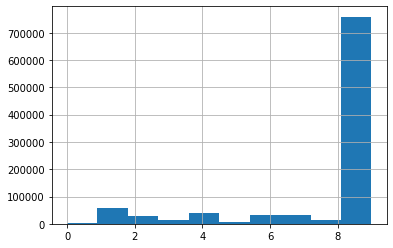

In [7]:
df_performance_test.cluster += 1

df_performance_test.cluster.hist()

In [26]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
def plot_performance_selected(df_performance,df_position,FD_targets,setup_all,dataset,misfit_tolerance,best_index):
    # Create traces

    fig = make_subplots(rows = 2, cols = 1,
                       subplot_titles = ("F - Phi Graph","Sweep Efficieny Graph"))

    ### F - Phi plot ###
    colorscale = ['#0d0887', '#46039f', '#7201a8', '#9c179e', '#bd3786', '#d8576b', '#ed7953', '#fb9f3a', '#fdca26', '#f0f921']


    for i in range (0,df_performance.iteration.max()):
        iteration = i 
        for j in range(0,df_performance.particle_no.max()):
            particle_no = j
            Phi = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)].Phi
            F = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)].F

            fig.add_trace(go.Scatter(x=Phi, y=F,
                                mode='lines',
                                line = dict(color = "lightgray"),
                                text = "nothing yet",
                                name = "Simulated"),row =1, col =1)
    
    for i in range (0,df_performance.iteration.max()):
        iteration = i 
        for j in range(0,df_performance.particle_no.max()):
            particle_no = j
            Phi = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)& (df_performance.misfit <= misfit_tolerance)].Phi
            F = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)& (df_performance.misfit <= misfit_tolerance)].F
#             cluster = int(df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)].cluster.unique())
            fig.add_trace(go.Scatter(x=Phi, y=F,
                                mode='lines',
                                line = dict(color = "gray"),
                                text = "nothing yet",
                                name = "Simulated"),row =1, col =1)
    
    for i in range (0,len(best_index)):
            iteration = int(df_position[(df_position.index == best_index[i])].iteration)
            particle_no = int(df_position[(df_position.index == best_index[i])].particle_no)
            Phi = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)& (df_performance.misfit <= misfit_tolerance)].Phi
            F = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)& (df_performance.misfit <= misfit_tolerance)].F
            fig.add_trace(go.Scatter(x=Phi, y=F,
                                mode='lines',
                                line = dict(color = colorscale[i] ),
                                text = "nothing yet",
                                name = "Simulated"),row =1, col =1)


    
    fig.add_trace(go.Scatter(x = FD_targets[dataset[0]]["Phi_interpolated"], y = FD_targets[dataset[0]]["F_interpolated"],
                            mode = "lines",
                            line = dict(color = "red", width = 3),
                            name = "target"),row =1, col =1)
    
    fig.add_trace(go.Scatter(x = [0,1], y = [0,1],
                            mode = "lines",
                            line = dict(color = "black", width = 3),
                            name = "homogeneous"),row =1, col =1)

    fig.update_xaxes(title_text = "Phi", range = [0,1],row =1, col =1)
    fig.update_yaxes(title_text = "F",range = [0,1], row =1, col = 1)

    ### Sweep efficiency plot ###
    
    for i in range (0,df_performance.iteration.max()):
        iteration = i 
        for j in range(0,df_performance.particle_no.max()):
            particle_no = j
            EV = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)].EV
            tD = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)].tD

            fig.add_trace(go.Scatter(x=tD, y=EV,
                                mode='lines',
                                line = dict(color = "lightgray"),
                                text = "nothing yet",
                                name = "Simulated"),row =2, col =1)

    for i in range (0,df_performance.iteration.max()):
        iteration = i 
        for j in range(0,df_performance.particle_no.max()):
            particle_no = j
            EV = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no) & (df_performance.misfit <= misfit_tolerance)].EV
            tD = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no) & (df_performance.misfit <= misfit_tolerance)].tD

            fig.add_trace(go.Scatter(x=tD, y=EV,
                                mode='lines',
                                line = dict(color = "gray"),
                                text = "nothing yet",
                                name = "best simulations"),row =2, col =1)
    
    for i in range (0,len(best_index)):
        iteration = int(df_position[(df_position.index == best_index[i])].iteration)
        particle_no = int(df_position[(df_position.index == best_index[i])].particle_no)
        EV = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)& (df_performance.misfit <= misfit_tolerance)].EV
        tD = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)& (df_performance.misfit <= misfit_tolerance)].tD
#             cluster = int(df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)].cluster.unique())
        fig.add_trace(go.Scatter(x=tD, y=EV,
                            mode='lines',
                            line = dict(color = colorscale[i] ),
                            text = "nothing yet",
                            name = "Simulated"),row =2, col =1)
    

    fig.update_xaxes(title_text = "tD", range = [0,1],row =2, col =1)
    fig.update_yaxes(title_text = "Ev",range = [0,1], row =2, col = 1)

    fig.update_layout(title='Performance Evaluation - Simulation run {}'.format(dataset),
                       autosize = False,
                     width = 1000,
                     height = 1000,
                     showlegend = False)

    fig.show()

In [27]:
# pio.renderers.default = "notebook"
pio.renderers.default = "browser"
plot_performance_selected(df_performance,df_position,FD_targets,setup_all,dataset,misfit_tolerance,best_index)